# 📚 Wikipedia Text Corpus Extraction Notebook
---
In this notebook, we’ll walk through the entire process of extracting and preparing textual data from a given Wikipedia .jsonl dataset. The final objective is to build a clean and structured text corpus that can serve as foundational data for various Natural Language Processing (NLP) applications, including but not limited to:
- Pretraining or fine-tuning transformer-based NLP models (e.g., BERT, GPT, RoBERTa)
- Text classification, summarization, and topic modeling
- Language modeling and embedding generation
- Information retrieval and question answering systems
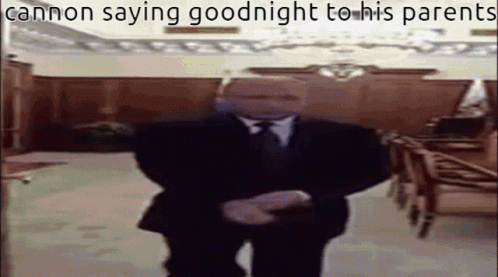
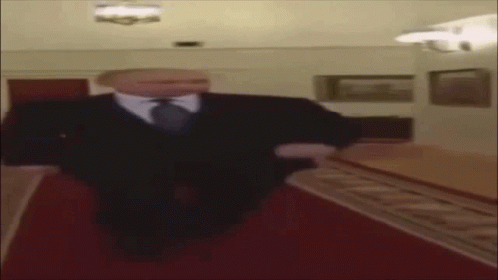

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from tqdm import tqdm

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
import json
import gc
paths = []
for dirname, _, filenames in os.walk('/kaggle/input/wikipedia-structured-contents/enwiki_namespace_0/'):
    for filename in filenames:
        paths.append(os.path.join(dirname, filename))
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/wikipedia-structured-contents/enwiki_namespace_0/enwiki_namespace_0_31.jsonl
/kaggle/input/wikipedia-structured-contents/enwiki_namespace_0/enwiki_namespace_0_26.jsonl
/kaggle/input/wikipedia-structured-contents/enwiki_namespace_0/enwiki_namespace_0_35.jsonl
/kaggle/input/wikipedia-structured-contents/enwiki_namespace_0/enwiki_namespace_0_14.jsonl
/kaggle/input/wikipedia-structured-contents/enwiki_namespace_0/enwiki_namespace_0_2.jsonl
/kaggle/input/wikipedia-structured-contents/enwiki_namespace_0/enwiki_namespace_0_21.jsonl
/kaggle/input/wikipedia-structured-contents/enwiki_namespace_0/enwiki_namespace_0_34.jsonl
/kaggle/input/wikipedia-structured-contents/enwiki_namespace_0/enwiki_namespace_0_10.jsonl
/kaggle/input/wikipedia-structured-contents/enwiki_namespace_0/enwiki_namespace_0_22.jsonl
/kaggle/input/wikipedia-structured-contents/enwiki_namespace_0/enwiki_namespace_0_20.jsonl
/kaggle/input/wikipedia-structured-contents/enwiki_namespace_0/enwiki_namespace_0_32.jsonl


## Loading and Inspecting the Dataset
---
The raw dataset is in .jsonl format—where each line is a separate JSON object typically containing structured data for a single Wikipedia article or passage. The first and most crucial step is to read and parse this file correctly in a memory-efficient way.
To handle this, we define the function `datasetOpening`, which takes care of:
- Opening the `.jsonl` file line by line (important for scalability with large dumps)
- Parsing each JSON entry safely
- Extracting and collecting the text content from each document or article
- Optionally filtering out any malformed or irrelevant records (like empty content or metadata)
This function effectively transforms the dataset into a list or generator of raw text strings, paving the way for preprocessing and corpus construction.

And the function `load_data_from_directory` assists in loading the data directly from the input and giving it ot the `datasetOpening` function to process and store the data in form of list and return the list.

In [2]:
# Trying to see the data and transforming it the in the appropriate form for training if required
def datasetOpening(file_path, max_records = None):
    data = []
    with open(file_path, 'r', encoding='utf-8') as f:
        for i, line in enumerate (tqdm(f)):
            if max_records and i>=max_records:
                break
            data.append(json.loads(line))
    return data


In [3]:
def load_data_from_directory(directory, start, end):
    data = []  # Initialize the list

    file_list = sorted(os.listdir(directory))  # Get all files in a sorted list
    selected_files = file_list[start:end]  # Slice based on start and end

    for file_name in selected_files:
        file_path = os.path.join(directory, file_name)
        data.append(datasetOpening(file_path))  # Load each file with your custom function

    print(f"Successfully loaded {len(data[0])} records")
    return data
    

## Data Modeling
---
Now that we know how to load data from the `kaggle/input` directory in a efficient manner it's to get into tansforming the data according to our need for that we'll be going through the following steps:

🔧 `convert_data_to_dataframe`
This function takes in the preprocessed list of JSON objects (each representing a Wikipedia article) and converts it into a pandas DataFrame.
- If your input list contains nested structures or multiple records per JSON entry, you may need to modify this function accordingly to flatten and normalize the data.
- This transformation allows for easier manipulation and inspection using pandas' rich set of tools.
  
🧹` cleaning_dataFrame`
Once the raw text is in tabular form, we apply this function to perform data cleaning operations:
- Filter out irrelevant or malformed entries, such as those lacking article body or essential metadata.
- Drop rows with null values—which, in the case of the Wikipedia dump, can constitute a significant portion of the dataset.
- You'll notice a considerable reduction in dataset size after this step, which is expected and desirable for ensuring higher data quality.


In [4]:
def convert_data_to_dataframe(data):
    df = pd.DataFrame(data[0])
    print(f"Dataset contains {len(df)} records")
    return df

In [5]:
def cleaning_dataFrame(df):
    df = df[['name', 'description', 'sections']]
    df.dropna(inplace=True)
    print(f"After cleaning the null rows {len(df)} records remain")
    return df

## 🏗️ Corpus Construction

With the cleaned and structured DataFrame in hand—containing fields such as Name, Description, and the actual content of each Wikipedia article—we can now move ahead with constructing a readable, linear text corpus from this data.
To achieve that, we introduce the `data_processor` function, which is responsible for:
- Iterating through each record in the DataFrame
- Extracting and formatting the Name, Description, and Content for every article
- Writing the processed text to a plain `.txt` file for downstream NLP use
⚠️ Resource Note
Processing the entire dataset in one go—especially on platforms like Kaggle or Google Colab—can be memory and time-intensive. To mitigate this, the data is automatically broken into smaller chunks of **5,000** rows to ensure stability and avoid kernel crashes.

🧪 `data_processor(df, file_name)` Function Highlights
- Dynamically names the output file based on file_name to preserve modularity
- Uses a chunking strategy to process large dataframes iteratively
- Applies basic null checks and fills in fallback text when fields like name, description, or sections are missing
- Utilizes a helper function like `format_text()` to transform section content into a readable string
- Appends each chunk to the file in batches to avoid overwriting


In [7]:
def data_processor(df, file_name):
    file_path = f"/kaggle/working/input{file_name}.txt" 
    # Creating the file with dynamic abbreaviations where each file corresponds to its respective jsonl element
    with open(file_path, "w", encoding="utf-8") as f:
        pass  
    
    chunk_size = 5000
    
    # Automate chunking based on the dataframe length
    for start in range(0, len(df), chunk_size):
        end = min(start + chunk_size, len(df))  # Prevent index overflow
        corpus = ""  # Reset corpus at the start of each chunk
    
        for i in range(start, end):
            name = df.iloc[i]['name'] if pd.notna(df.iloc[i]['name']) else "Unknown Name"
            description = df.iloc[i]['description'] if pd.notna(df.iloc[i]['description']) else "No Description"
            
            sections = df.iloc[i]['sections']
            content = format_text(sections) if isinstance(sections, list) else "No Content Available"
    
            corpus += f"\n{name}\n{description}\n{content}\n\n"
    
        # Append processed data to the file instead of overwriting
        with open(file_path, "a", encoding="utf-8") as f:
            f.write(corpus)
    
    print(f"Processing completed. Data saved to input{file_name}.txt")

In [6]:
def format_text(data):
    formatted_text = ""
    for section in data:
        heading = section.get('name', 'Unknown Section')
        formatted_text += f"\n{heading}\n\n"
        if 'has_parts' in section:
            for part in section['has_parts']:
                formatted_text += f"{part.get('value', '')}\n\n"
    return formatted_text.strip()


## 🔄 Batch Processing JSONL Files

To efficiently handle a large number of `.jsonl` files from the `Wikipedia` dataset, we use a chunked processing strategy. This approach enables scalable and memory-conscious data transformation—particularly important when working in constrained environments like Kaggle or Colab.
📂 Directory Setup & File Count
We begin by specifying the dataset directory and counting all individual files (ignoring subdirectories) to determine how many need to be processed.

**🔁 Iterative Processing with Memory Optimization**
We process the files in batches—here, one file at a time—using a loop that loads, transforms, and writes a chunk of data before clearing memory. This includes:
- Dynamically selecting a small number of files (**file_chunk = 1**) per iteration to keep the memory footprint manageable.
- Loading and converting the data into a DataFrame using the `load_data_from_directory`, `convert_data_to_dataframe`, and `cleaning_dataFrame` functions.
- Passing the cleaned DataFrame to `data_processor()` to extract *Name, Description,* and *content* into a plain-text corpus.
- Explicitly deleting the used variables and calling garbage collection after each iteration to free up memory.
At the end of processing, a completion message is printed to confirm that the entire dataset has been successfully handled with memory optimization in mind.


In [8]:
directory = "/kaggle/input/wikipedia-structured-contents/enwiki_namespace_0"
num_files = len([file for file in os.listdir(directory) if os.path.isfile(os.path.join(directory, file))])

print(f"Number of files in {directory}: {num_files}")

file_chunk = 1  # Process files in chunks of 1

for start in range(0, num_files, file_chunk):
    end = min(start + file_chunk, num_files)

    # Load and process data
    data = load_data_from_directory(directory, start, end)  
    df = convert_data_to_dataframe(data)
    df = cleaning_dataFrame(df)
    data_processor(df, start)

    # Clear RAM after processing each chunk
    del data, df
    gc.collect()

print("Processing completed successfully with memory optimization!")

Number of files in /kaggle/input/wikipedia-structured-contents/enwiki_namespace_0: 38


309509it [01:05, 4690.47it/s]


Successfully loaded 309509 records
Dataset contains 309509 records
After cleaning the null rows 252628 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input0.txt


311598it [01:16, 4095.51it/s]


Successfully loaded 311598 records
Dataset contains 311598 records
After cleaning the null rows 255490 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input1.txt


317525it [01:04, 4937.01it/s]


Successfully loaded 317525 records
Dataset contains 317525 records


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


After cleaning the null rows 257772 records remain
Processing completed. Data saved to input2.txt


309055it [01:04, 4826.98it/s]


Successfully loaded 309055 records
Dataset contains 309055 records
After cleaning the null rows 254923 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input3.txt


226514it [01:03, 3564.61it/s]


Successfully loaded 226514 records
Dataset contains 226514 records
After cleaning the null rows 192331 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input4.txt


217557it [01:03, 3433.69it/s]


Successfully loaded 217557 records
Dataset contains 217557 records
After cleaning the null rows 181111 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input5.txt


207996it [01:03, 3280.52it/s]


Successfully loaded 207996 records
Dataset contains 207996 records
After cleaning the null rows 172595 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input6.txt


198331it [01:03, 3140.73it/s]


Successfully loaded 198331 records
Dataset contains 198331 records
After cleaning the null rows 166941 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input7.txt


199464it [01:02, 3189.96it/s]


Successfully loaded 199464 records
Dataset contains 199464 records
After cleaning the null rows 170015 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input8.txt


190693it [01:02, 3060.30it/s]


Successfully loaded 190693 records
Dataset contains 190693 records
After cleaning the null rows 161891 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input9.txt


185750it [01:03, 2909.28it/s]


Successfully loaded 185750 records
Dataset contains 185750 records
After cleaning the null rows 160831 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input10.txt


170688it [01:01, 2769.37it/s]


Successfully loaded 170688 records
Dataset contains 170688 records
After cleaning the null rows 148501 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input11.txt


314347it [01:03, 4970.20it/s]


Successfully loaded 314347 records
Dataset contains 314347 records


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


After cleaning the null rows 256272 records remain
Processing completed. Data saved to input12.txt


175824it [01:03, 2786.84it/s]


Successfully loaded 175824 records
Dataset contains 175824 records
After cleaning the null rows 148261 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input13.txt


164049it [01:01, 2682.24it/s]


Successfully loaded 164049 records
Dataset contains 164049 records
After cleaning the null rows 135460 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input14.txt


150711it [01:01, 2457.41it/s]


Successfully loaded 150711 records
Dataset contains 150711 records
After cleaning the null rows 126743 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input15.txt


154040it [01:02, 2454.05it/s]


Successfully loaded 154040 records
Dataset contains 154040 records
After cleaning the null rows 133120 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)
141211it [01:02, 2265.19it/s]


Successfully loaded 141211 records
Dataset contains 141211 records
After cleaning the null rows 118763 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input18.txt


135344it [01:02, 2182.73it/s]


Successfully loaded 135344 records
Dataset contains 135344 records
After cleaning the null rows 116149 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input19.txt


125575it [01:01, 2054.23it/s]


Successfully loaded 125575 records
Dataset contains 125575 records
After cleaning the null rows 107588 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input20.txt


118949it [00:57, 2054.37it/s]


Successfully loaded 118949 records
Dataset contains 118949 records
After cleaning the null rows 102669 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input21.txt


105857it [00:58, 1797.18it/s]


Successfully loaded 105857 records
Dataset contains 105857 records
After cleaning the null rows 91297 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input22.txt


310478it [01:03, 4887.51it/s]


Successfully loaded 310478 records
Dataset contains 310478 records


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


After cleaning the null rows 252906 records remain
Processing completed. Data saved to input23.txt


98407it [00:57, 1715.23it/s]


Successfully loaded 98407 records
Dataset contains 98407 records
After cleaning the null rows 84904 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input24.txt


81538it [00:57, 1406.94it/s]


Successfully loaded 81538 records
Dataset contains 81538 records
After cleaning the null rows 67482 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input25.txt


79811it [01:00, 1329.97it/s]


Successfully loaded 79811 records
Dataset contains 79811 records
After cleaning the null rows 65131 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input26.txt


87244it [00:56, 1545.27it/s]


Successfully loaded 87244 records
Dataset contains 87244 records
After cleaning the null rows 73732 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input27.txt


83733it [00:57, 1455.93it/s]


Successfully loaded 83733 records
Dataset contains 83733 records
After cleaning the null rows 70259 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input28.txt


84810it [00:58, 1449.08it/s]


Successfully loaded 84810 records
Dataset contains 84810 records
After cleaning the null rows 71385 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input29.txt


86965it [00:58, 1494.83it/s]


Successfully loaded 86965 records
Dataset contains 86965 records
After cleaning the null rows 73523 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input30.txt


4531it [00:02, 1715.42it/s]
/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Successfully loaded 4531 records
Dataset contains 4531 records
After cleaning the null rows 3824 records remain
Processing completed. Data saved to input31.txt


313250it [01:04, 4879.25it/s]


Successfully loaded 313250 records
Dataset contains 313250 records
After cleaning the null rows 257149 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input32.txt


317789it [01:02, 5065.22it/s]


Successfully loaded 317789 records
Dataset contains 317789 records
After cleaning the null rows 261805 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input33.txt


314632it [01:04, 4892.38it/s]


Successfully loaded 314632 records
Dataset contains 314632 records
After cleaning the null rows 254871 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input34.txt


318386it [01:03, 4987.60it/s]


Successfully loaded 318386 records
Dataset contains 318386 records


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


After cleaning the null rows 260549 records remain
Processing completed. Data saved to input35.txt


313740it [01:06, 4743.00it/s]


Successfully loaded 313740 records
Dataset contains 313740 records
After cleaning the null rows 257003 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input36.txt


317405it [01:06, 4765.95it/s]


Successfully loaded 317405 records
Dataset contains 317405 records
After cleaning the null rows 260414 records remain


/tmp/ipykernel_35/2782621335.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


Processing completed. Data saved to input37.txt
Processing completed successfully with memory optimization!


## ✅ Conclusion

---

In this notebook, we successfully walked through the full pipeline of converting raw Wikipedia .jsonl files into a clean and structured text corpus, suitable for a wide range of NLP tasks. From loading and inspecting the dataset, to cleaning and modeling the data using pandas, and finally constructing the corpus in manageable chunks—we’ve built a scalable and reproducible workflow optimized for large-scale datasets.
This approach ensures that whether you're fine-tuning transformer models, building embeddings, or simply exploring linguistic trends, your corpus is well-prepared and memory-efficient.

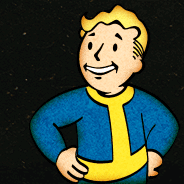